<a href="https://colab.research.google.com/github/GerGoar/Image_Deep_Learning_Project/blob/main/Stable_Diffusion_Image_Generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Generation

In [1]:
!pip install -U diffusers[training] #in case collab resets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 37.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 43.2 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      S

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

!sudo apt -qq install git-lfs
!git config --global credential.helper store

git-lfs is already the newest version (3.0.2-1ubuntu0.3).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Generating images BEFORE fine-tuning...



  0%|          | 0/50 [00:00<?, ?it/s]

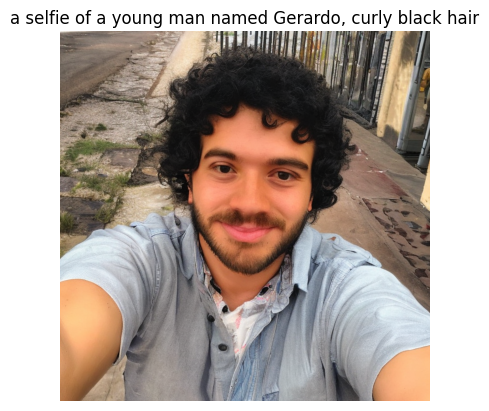

  0%|          | 0/50 [00:00<?, ?it/s]

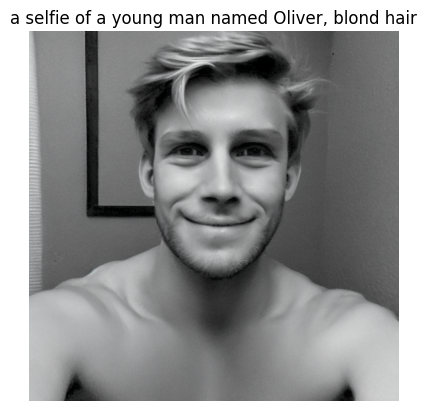

  0%|          | 0/50 [00:00<?, ?it/s]

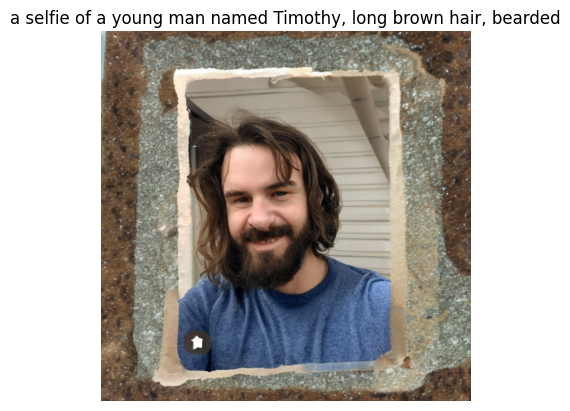

In [ ]:
from diffusers import StableDiffusionPipeline, UNet2DConditionModel
import torch
from huggingface_hub import hf_hub_download
import matplotlib.pyplot as plt

name_to_prompt = {
    "Gerardo": "a selfie of a young man named Gerardo, curly black hair",
    "Oliver": "a selfie of a young man named Oliver, blond hair",
    "Timothy": "a selfie of a young man named Timothy, long brown hair, bearded"
}

# Load base model
pipe_base = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1").to("cuda")
pipe_base.text_encoder.eval()

def generate_and_show(prompt, filename):
    with torch.autocast("cuda"):
        image = pipe_base(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]
    image.save(filename)
    plt.imshow(image)
    plt.axis("off")
    plt.title(prompt)
    plt.show()

# 🔹 BEFORE fine-tuning
print("Generating images BEFORE fine-tuning...\n")
for name, prompt in name_to_prompt.items():
    generate_and_show(prompt, f"before_{name.lower()}.png")

## Creating the Images, Inspecting quality

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

pipe_fine = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1").to("cuda")


pipe_fine.unet.load_attn_procs("otausendschoen/sd21-faces-lora")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

pytorch_lora_weights.safetensors:   0%|          | 0.00/1.68M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/diffusers/loaders/unet.py:212: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


In [ ]:
print(" LoRA modules loaded, let's check if its fine tuned::")
print(pipe_base.unet.attn_processors.keys())
print(pipe_fine.unet.attn_processors.keys())


 LoRA modules loaded, let's check if its fine tuned::
dict_keys(['down_blocks.0.attentions.0.transformer_blocks.0.attn1.processor', 'down_blocks.0.attentions.0.transformer_blocks.0.attn2.processor', 'down_blocks.0.attentions.1.transformer_blocks.0.attn1.processor', 'down_blocks.0.attentions.1.transformer_blocks.0.attn2.processor', 'down_blocks.1.attentions.0.transformer_blocks.0.attn1.processor', 'down_blocks.1.attentions.0.transformer_blocks.0.attn2.processor', 'down_blocks.1.attentions.1.transformer_blocks.0.attn1.processor', 'down_blocks.1.attentions.1.transformer_blocks.0.attn2.processor', 'down_blocks.2.attentions.0.transformer_blocks.0.attn1.processor', 'down_blocks.2.attentions.0.transformer_blocks.0.attn2.processor', 'down_blocks.2.attentions.1.transformer_blocks.0.attn1.processor', 'down_blocks.2.attentions.1.transformer_blocks.0.attn2.processor', 'up_blocks.1.attentions.0.transformer_blocks.0.attn1.processor', 'up_blocks.1.attentions.0.transformer_blocks.0.attn2.processor', '

Generating images AFTER fine-tuning...



  0%|          | 0/50 [00:00<?, ?it/s]

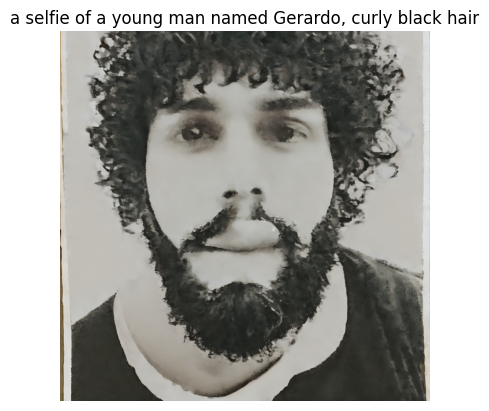

  0%|          | 0/50 [00:00<?, ?it/s]

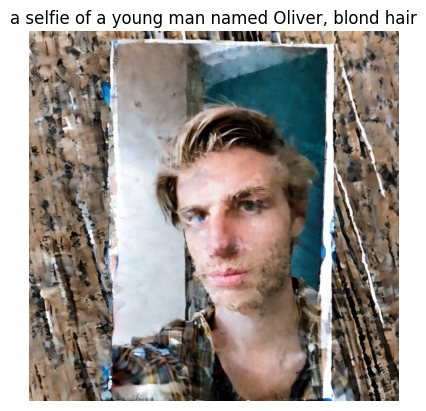

  0%|          | 0/50 [00:00<?, ?it/s]

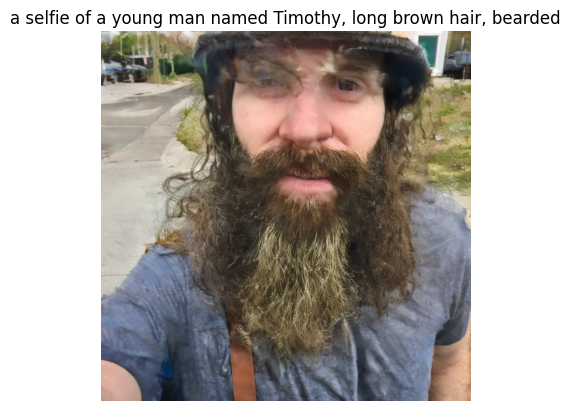

In [ ]:

name_to_prompt = {
    "Gerardo": "a selfie of a young man named Gerardo, curly black hair",
    "Oliver": "a selfie of a young man named Oliver, blond hair",
    "Timothy": "a selfie of a young man named Timothy, long brown hair, bearded"
}


def generate_and_show(prompt, filename):
    with torch.autocast("cuda"):
        image = pipe_fine(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]
    image.save(filename)
    plt.imshow(image)
    plt.axis("off")
    plt.title(prompt)
    plt.show()

# 🔹 AFTER fine-tuning
print("Generating images AFTER fine-tuning...\n")
for name, prompt in name_to_prompt.items():
    generate_and_show(prompt, f"after_{name.lower()}.png")

## Mass Generations

## CONTINUE HERE

## Mass Upload

In [2]:
from diffusers import StableDiffusionPipeline
import torch

pipe_fine = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1").to("cuda")


pipe_fine.unet.load_attn_procs("otausendschoen/sd21-faces-lora")


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

pytorch_lora_weights.safetensors:   0%|          | 0.00/1.68M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/diffusers/loaders/unet.py:212: FutureWarning: `load_attn_procs` is deprecated and will be removed in version 0.40.0. Using the `load_attn_procs()` method has been deprecated and will be removed in a future version. Please use `load_lora_adapter()`.
  deprecate("load_attn_procs", "0.40.0", deprecation_message)


In [3]:
import os
def get_last_index(folder):
    """Returns the max image index found in folder, or -1 if empty."""
    if not os.path.exists(folder):
        print(f"Folder does not exist: {folder}")
        return -1

    files = [f for f in os.listdir(folder) if f.endswith(".jpg")]
    if not files:
        print(f" Folder exists but has no .jpg files: {folder}")
        return -1

    indices = []
    for fname in files:
        try:
            index = int(fname.split(".")[0])
            indices.append(index)
        except ValueError:
            continue

    return max(indices) if indices else -1


Now let's safe them inside the output folder instead of plotting them:

In [ ]:
import os
from tqdm import tqdm
import torch
from diffusers import StableDiffusionPipeline

# === 1. Define prompt mapping ===
name_to_prompt = {
    "Gerardo": "a selfie of a young man named Gerardo, curly black hair",
    "Oliver": "a selfie of a young man named Oliver, blond hair",
    "Timothy": "a selfie of a young man named Timothy, long brown hair, bearded"
}

# === 4. Image generation loop ===
def generate_class_conditional_images(pipe, prompts, num_images_per_class=50):
    output_root = "output"
    os.makedirs(output_root, exist_ok=True)

    for name, prompt in prompts.items():
        output_dir = os.path.join(output_root, name)
        os.makedirs(output_dir, exist_ok=True)

        start_idx = get_last_index(output_dir) + 1
        end_idx = start_idx + num_images_per_class

        print(f"🔹 {name}: Starting at index {start_idx}, generating {num_images_per_class} images")

        for i in tqdm(range(start_idx, end_idx), desc=f"Generating {name}"):
            with torch.autocast("cuda"):
              image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

            image.save(os.path.join(output_dir, f"{i}.jpg"))

    print("✅ All images generated and saved.")

# === 5. Run it ===
generate_class_conditional_images(pipe_fine, name_to_prompt, num_images_per_class=50)


 Folder exists but has no .jpg files: output/Gerardo
🔹 Gerardo: Starting at index 0, generating 50 images


Generating Gerardo:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   2%|▏         | 1/50 [00:19<16:15, 19.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   4%|▍         | 2/50 [00:40<16:13, 20.29s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   6%|▌         | 3/50 [01:00<15:45, 20.12s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   8%|▊         | 4/50 [01:20<15:27, 20.17s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  10%|█         | 5/50 [01:41<15:13, 20.30s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  12%|█▏        | 6/50 [02:02<15:02, 20.50s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  14%|█▍        | 7/50 [02:23<14:52, 20.76s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  16%|█▌        | 8/50 [02:43<14:25, 20.61s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  18%|█▊        | 9/50 [03:04<14:02, 20.54s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  20%|██        | 10/50 [03:24<13:40, 20.50s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  22%|██▏       | 11/50 [03:44<13:17, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  24%|██▍       | 12/50 [04:05<12:56, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  26%|██▌       | 13/50 [04:25<12:34, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  28%|██▊       | 14/50 [04:45<12:13, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  30%|███       | 15/50 [05:06<11:52, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  32%|███▏      | 16/50 [05:26<11:32, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  34%|███▍      | 17/50 [05:46<11:11, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  36%|███▌      | 18/50 [06:07<10:51, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  38%|███▊      | 19/50 [06:27<10:31, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  40%|████      | 20/50 [06:47<10:10, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  42%|████▏     | 21/50 [07:08<09:50, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  44%|████▍     | 22/50 [07:28<09:30, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  46%|████▌     | 23/50 [07:49<09:09, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  48%|████▊     | 24/50 [08:09<08:49, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  50%|█████     | 25/50 [08:29<08:28, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  52%|█████▏    | 26/50 [08:50<08:08, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  54%|█████▍    | 27/50 [09:10<07:48, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  56%|█████▌    | 28/50 [09:30<07:27, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  58%|█████▊    | 29/50 [09:51<07:07, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  60%|██████    | 30/50 [10:11<06:47, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  62%|██████▏   | 31/50 [10:31<06:26, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  64%|██████▍   | 32/50 [10:52<06:06, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  66%|██████▌   | 33/50 [11:12<05:46, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  68%|██████▊   | 34/50 [11:32<05:25, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  70%|███████   | 35/50 [11:53<05:05, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  72%|███████▏  | 36/50 [12:13<04:44, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  74%|███████▍  | 37/50 [12:34<04:24, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  76%|███████▌  | 38/50 [12:54<04:04, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  78%|███████▊  | 39/50 [13:14<03:43, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  80%|████████  | 40/50 [13:35<03:23, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  82%|████████▏ | 41/50 [13:55<03:03, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  84%|████████▍ | 42/50 [14:15<02:42, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  86%|████████▌ | 43/50 [14:36<02:22, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  88%|████████▊ | 44/50 [14:56<02:02, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  90%|█████████ | 45/50 [15:16<01:41, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  92%|█████████▏| 46/50 [15:37<01:21, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  94%|█████████▍| 47/50 [15:57<01:01, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  96%|█████████▌| 48/50 [16:17<00:40, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  98%|█████████▊| 49/50 [16:38<00:20, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo: 100%|██████████| 50/50 [16:58<00:00, 20.37s/it]


 Folder exists but has no .jpg files: output/Oliver
🔹 Oliver: Starting at index 0, generating 50 images


Generating Oliver:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   2%|▏         | 1/50 [00:20<16:36, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   4%|▍         | 2/50 [00:40<16:17, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   6%|▌         | 3/50 [01:01<15:56, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   8%|▊         | 4/50 [01:21<15:36, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  10%|█         | 5/50 [01:41<15:16, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  12%|█▏        | 6/50 [02:02<14:56, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  14%|█▍        | 7/50 [02:22<14:35, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  16%|█▌        | 8/50 [02:42<14:16, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  18%|█▊        | 9/50 [03:03<13:55, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  20%|██        | 10/50 [03:23<13:35, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  22%|██▏       | 11/50 [03:44<13:14, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  24%|██▍       | 12/50 [04:04<12:53, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  26%|██▌       | 13/50 [04:24<12:33, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  28%|██▊       | 14/50 [04:45<12:12, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  30%|███       | 15/50 [05:05<11:52, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  32%|███▏      | 16/50 [05:25<11:31, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  34%|███▍      | 17/50 [05:46<11:11, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  36%|███▌      | 18/50 [06:06<10:51, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  38%|███▊      | 19/50 [06:26<10:30, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  40%|████      | 20/50 [06:47<10:11, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  42%|████▏     | 21/50 [07:07<09:50, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  44%|████▍     | 22/50 [07:28<09:33, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  46%|████▌     | 23/50 [07:48<09:12, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  48%|████▊     | 24/50 [08:09<08:50, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  50%|█████     | 25/50 [08:29<08:29, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  52%|█████▏    | 26/50 [08:49<08:09, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  54%|█████▍    | 27/50 [09:10<07:48, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  56%|█████▌    | 28/50 [09:30<07:28, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  58%|█████▊    | 29/50 [09:50<07:08, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  60%|██████    | 30/50 [10:11<06:47, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  62%|██████▏   | 31/50 [10:31<06:27, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  64%|██████▍   | 32/50 [10:52<06:06, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  66%|██████▌   | 33/50 [11:12<05:46, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  68%|██████▊   | 34/50 [11:32<05:25, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  70%|███████   | 35/50 [11:53<05:05, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  72%|███████▏  | 36/50 [12:13<04:45, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  74%|███████▍  | 37/50 [12:33<04:25, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  76%|███████▌  | 38/50 [12:54<04:04, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  78%|███████▊  | 39/50 [13:14<03:44, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  80%|████████  | 40/50 [13:34<03:23, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  82%|████████▏ | 41/50 [13:55<03:03, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  84%|████████▍ | 42/50 [14:15<02:42, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  86%|████████▌ | 43/50 [14:35<02:22, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  88%|████████▊ | 44/50 [14:56<02:02, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  90%|█████████ | 45/50 [15:16<01:41, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  92%|█████████▏| 46/50 [15:37<01:21, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  94%|█████████▍| 47/50 [15:57<01:01, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  96%|█████████▌| 48/50 [16:17<00:40, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  98%|█████████▊| 49/50 [16:38<00:20, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver: 100%|██████████| 50/50 [16:58<00:00, 20.37s/it]


 Folder exists but has no .jpg files: output/Timothy
🔹 Timothy: Starting at index 0, generating 50 images


Generating Timothy:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   2%|▏         | 1/50 [00:20<16:37, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   4%|▍         | 2/50 [00:40<16:17, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   6%|▌         | 3/50 [01:01<15:57, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   8%|▊         | 4/50 [01:21<15:36, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  10%|█         | 5/50 [01:41<15:16, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  12%|█▏        | 6/50 [02:02<14:56, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  14%|█▍        | 7/50 [02:22<14:35, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  16%|█▌        | 8/50 [02:42<14:14, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  18%|█▊        | 9/50 [03:03<13:53, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  20%|██        | 10/50 [03:23<13:33, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  22%|██▏       | 11/50 [03:43<13:14, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  24%|██▍       | 12/50 [04:04<12:53, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  26%|██▌       | 13/50 [04:24<12:32, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  28%|██▊       | 14/50 [04:44<12:12, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  30%|███       | 15/50 [05:05<11:52, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  32%|███▏      | 16/50 [05:25<11:32, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  34%|███▍      | 17/50 [05:46<11:11, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  36%|███▌      | 18/50 [06:06<10:51, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  38%|███▊      | 19/50 [06:26<10:30, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  40%|████      | 20/50 [06:47<10:10, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  42%|████▏     | 21/50 [07:07<09:49, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  44%|████▍     | 22/50 [07:27<09:29, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  46%|████▌     | 23/50 [07:48<09:09, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  48%|████▊     | 24/50 [08:08<08:49, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  50%|█████     | 25/50 [08:28<08:28, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  52%|█████▏    | 26/50 [08:49<08:08, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  54%|█████▍    | 27/50 [09:09<07:47, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  56%|█████▌    | 28/50 [09:29<07:27, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  58%|█████▊    | 29/50 [09:50<07:07, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  60%|██████    | 30/50 [10:10<06:46, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  62%|██████▏   | 31/50 [10:30<06:26, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  64%|██████▍   | 32/50 [10:51<06:06, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  66%|██████▌   | 33/50 [11:11<05:45, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  68%|██████▊   | 34/50 [11:32<05:25, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  70%|███████   | 35/50 [11:52<05:05, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  72%|███████▏  | 36/50 [12:12<04:44, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  74%|███████▍  | 37/50 [12:33<04:24, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  76%|███████▌  | 38/50 [12:53<04:04, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  78%|███████▊  | 39/50 [13:13<03:44, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  80%|████████  | 40/50 [13:34<03:23, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  82%|████████▏ | 41/50 [13:54<03:03, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  84%|████████▍ | 42/50 [14:14<02:42, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  86%|████████▌ | 43/50 [14:35<02:22, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  88%|████████▊ | 44/50 [14:55<02:02, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  90%|█████████ | 45/50 [15:15<01:41, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  92%|█████████▏| 46/50 [15:36<01:21, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  94%|█████████▍| 47/50 [15:56<01:01, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  96%|█████████▌| 48/50 [16:17<00:40, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  98%|█████████▊| 49/50 [16:37<00:20, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy: 100%|██████████| 50/50 [16:57<00:00, 20.36s/it]

✅ All images generated and saved.


In [ ]:
import os
from tqdm import tqdm
import torch
from diffusers import StableDiffusionPipeline

# === 1. Define prompt mapping ===
name_to_prompt = {
    "Gerardo": "a selfie of a young man named Gerardo",
    "Oliver": "a selfie of a young man named Oliver",
    "Timothy": "a selfie of a young man named Timothy"
}

# === 4. Image generation loop ===
def generate_class_conditional_images(pipe, prompts, num_images_per_class=50):
    output_root = "output"
    os.makedirs(output_root, exist_ok=True)

    for name, prompt in prompts.items():
        output_dir = os.path.join(output_root, name)
        os.makedirs(output_dir, exist_ok=True)

        start_idx = get_last_index(output_dir) + 1
        end_idx = start_idx + num_images_per_class

        print(f"🔹 {name}: Starting at index {start_idx}, generating {num_images_per_class} images")

        for i in tqdm(range(start_idx, end_idx), desc=f"Generating {name}"):
            with torch.autocast("cuda"):
              image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

            image.save(os.path.join(output_dir, f"{i}.jpg"))

    print("✅ All images generated and saved.")

# === 5. Run it ===
generate_class_conditional_images(pipe_fine, name_to_prompt, num_images_per_class=50)


🔹 Gerardo: Starting at index 50, generating 50 images


Generating Gerardo:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   2%|▏         | 1/50 [00:20<16:40, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   4%|▍         | 2/50 [00:40<16:18, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   6%|▌         | 3/50 [01:01<15:56, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   8%|▊         | 4/50 [01:21<15:36, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  10%|█         | 5/50 [01:41<15:16, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  12%|█▏        | 6/50 [02:02<14:55, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  14%|█▍        | 7/50 [02:22<14:34, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  16%|█▌        | 8/50 [02:42<14:14, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  18%|█▊        | 9/50 [03:03<13:54, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  20%|██        | 10/50 [03:23<13:34, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  22%|██▏       | 11/50 [03:43<13:14, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  24%|██▍       | 12/50 [04:04<12:53, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  26%|██▌       | 13/50 [04:24<12:32, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  28%|██▊       | 14/50 [04:44<12:12, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  30%|███       | 15/50 [05:05<11:52, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  32%|███▏      | 16/50 [05:25<11:31, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  34%|███▍      | 17/50 [05:45<11:10, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  36%|███▌      | 18/50 [06:06<10:51, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  38%|███▊      | 19/50 [06:26<10:31, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  40%|████      | 20/50 [06:47<10:10, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  42%|████▏     | 21/50 [07:07<09:50, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  44%|████▍     | 22/50 [07:27<09:29, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  46%|████▌     | 23/50 [07:48<09:09, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  48%|████▊     | 24/50 [08:08<08:49, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  50%|█████     | 25/50 [08:28<08:28, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  52%|█████▏    | 26/50 [08:49<08:08, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  54%|█████▍    | 27/50 [09:09<07:48, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  56%|█████▌    | 28/50 [09:29<07:27, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  58%|█████▊    | 29/50 [09:50<07:07, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  60%|██████    | 30/50 [10:10<06:46, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  62%|██████▏   | 31/50 [10:30<06:26, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  64%|██████▍   | 32/50 [10:51<06:06, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  66%|██████▌   | 33/50 [11:11<05:45, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  68%|██████▊   | 34/50 [11:31<05:25, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  70%|███████   | 35/50 [11:52<05:05, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  72%|███████▏  | 36/50 [12:12<04:44, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  74%|███████▍  | 37/50 [12:32<04:24, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  76%|███████▌  | 38/50 [12:53<04:04, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  78%|███████▊  | 39/50 [13:13<03:43, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  80%|████████  | 40/50 [13:33<03:23, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  82%|████████▏ | 41/50 [13:54<03:02, 20.32s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  84%|████████▍ | 42/50 [14:14<02:42, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  86%|████████▌ | 43/50 [14:34<02:22, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  88%|████████▊ | 44/50 [14:55<02:01, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  90%|█████████ | 45/50 [15:15<01:41, 20.32s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  92%|█████████▏| 46/50 [15:35<01:21, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  94%|█████████▍| 47/50 [15:56<01:00, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  96%|█████████▌| 48/50 [16:16<00:40, 20.33s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  98%|█████████▊| 49/50 [16:36<00:20, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo: 100%|██████████| 50/50 [16:57<00:00, 20.34s/it]


🔹 Oliver: Starting at index 50, generating 50 images


Generating Oliver:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   2%|▏         | 1/50 [00:20<16:37, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   4%|▍         | 2/50 [00:40<16:17, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   6%|▌         | 3/50 [01:01<15:56, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   8%|▊         | 4/50 [01:21<15:36, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  10%|█         | 5/50 [01:41<15:15, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  12%|█▏        | 6/50 [02:02<14:55, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  14%|█▍        | 7/50 [02:22<14:35, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  16%|█▌        | 8/50 [02:42<14:15, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  18%|█▊        | 9/50 [03:03<13:54, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  20%|██        | 10/50 [03:23<13:34, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  22%|██▏       | 11/50 [03:43<13:13, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  24%|██▍       | 12/50 [04:04<12:53, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  26%|██▌       | 13/50 [04:24<12:32, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  28%|██▊       | 14/50 [04:44<12:12, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  30%|███       | 15/50 [05:05<11:51, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  32%|███▏      | 16/50 [05:25<11:31, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  34%|███▍      | 17/50 [05:45<11:11, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  36%|███▌      | 18/50 [06:06<10:50, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  38%|███▊      | 19/50 [06:26<10:30, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  40%|████      | 20/50 [06:46<10:10, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  42%|████▏     | 21/50 [07:07<09:50, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  44%|████▍     | 22/50 [07:27<09:29, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  46%|████▌     | 23/50 [07:48<09:09, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  48%|████▊     | 24/50 [08:08<08:49, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  50%|█████     | 25/50 [08:28<08:28, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  52%|█████▏    | 26/50 [08:49<08:08, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  54%|█████▍    | 27/50 [09:09<07:48, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  56%|█████▌    | 28/50 [09:29<07:27, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  58%|█████▊    | 29/50 [09:50<07:07, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  60%|██████    | 30/50 [10:10<06:47, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  62%|██████▏   | 31/50 [10:30<06:26, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  64%|██████▍   | 32/50 [10:51<06:06, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  66%|██████▌   | 33/50 [11:11<05:46, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  68%|██████▊   | 34/50 [11:31<05:25, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  70%|███████   | 35/50 [11:52<05:05, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  72%|███████▏  | 36/50 [12:12<04:45, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  74%|███████▍  | 37/50 [12:33<04:24, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  76%|███████▌  | 38/50 [12:53<04:04, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  78%|███████▊  | 39/50 [13:13<03:43, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  80%|████████  | 40/50 [13:34<03:23, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  82%|████████▏ | 41/50 [13:54<03:03, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  84%|████████▍ | 42/50 [14:14<02:42, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  86%|████████▌ | 43/50 [14:35<02:22, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  88%|████████▊ | 44/50 [14:55<02:02, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  90%|█████████ | 45/50 [15:15<01:41, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  92%|█████████▏| 46/50 [15:36<01:21, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  94%|█████████▍| 47/50 [15:56<01:01, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  96%|█████████▌| 48/50 [16:16<00:40, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  98%|█████████▊| 49/50 [16:37<00:20, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver: 100%|██████████| 50/50 [16:57<00:00, 20.35s/it]


🔹 Timothy: Starting at index 50, generating 50 images


Generating Timothy:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   2%|▏         | 1/50 [00:20<16:37, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   4%|▍         | 2/50 [00:40<16:17, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   6%|▌         | 3/50 [01:01<15:56, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   8%|▊         | 4/50 [01:21<15:36, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  10%|█         | 5/50 [01:41<15:16, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  12%|█▏        | 6/50 [02:02<14:55, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  14%|█▍        | 7/50 [02:22<14:35, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  16%|█▌        | 8/50 [02:42<14:15, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  18%|█▊        | 9/50 [03:03<13:55, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  20%|██        | 10/50 [03:23<13:35, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  22%|██▏       | 11/50 [03:44<13:14, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  24%|██▍       | 12/50 [04:04<12:54, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  26%|██▌       | 13/50 [04:24<12:34, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  28%|██▊       | 14/50 [04:45<12:13, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  30%|███       | 15/50 [05:05<11:53, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  32%|███▏      | 16/50 [05:25<11:33, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  34%|███▍      | 17/50 [05:46<11:12, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  36%|███▌      | 18/50 [06:06<10:52, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  38%|███▊      | 19/50 [06:27<10:32, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  40%|████      | 20/50 [06:47<10:11, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  42%|████▏     | 21/50 [07:07<09:51, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  44%|████▍     | 22/50 [07:28<09:30, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  46%|████▌     | 23/50 [07:48<09:10, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  48%|████▊     | 24/50 [08:09<08:49, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  50%|█████     | 25/50 [08:29<08:29, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  52%|█████▏    | 26/50 [08:49<08:08, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  54%|█████▍    | 27/50 [09:10<07:48, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  56%|█████▌    | 28/50 [09:30<07:27, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  58%|█████▊    | 29/50 [09:50<07:07, 20.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  60%|██████    | 30/50 [10:11<06:46, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  62%|██████▏   | 31/50 [10:31<06:26, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  64%|██████▍   | 32/50 [10:51<06:06, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  66%|██████▌   | 33/50 [11:12<05:45, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  68%|██████▊   | 34/50 [11:32<05:25, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  70%|███████   | 35/50 [11:52<05:05, 20.35s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  72%|███████▏  | 36/50 [12:13<04:45, 20.36s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  74%|███████▍  | 37/50 [12:33<04:24, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  76%|███████▌  | 38/50 [12:54<04:04, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  78%|███████▊  | 39/50 [13:14<03:44, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  80%|████████  | 40/50 [13:34<03:23, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  82%|████████▏ | 41/50 [13:55<03:03, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  84%|████████▍ | 42/50 [14:15<02:43, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  86%|████████▌ | 43/50 [14:35<02:22, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  88%|████████▊ | 44/50 [14:56<02:02, 20.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  90%|█████████ | 45/50 [15:16<01:41, 20.38s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  92%|█████████▏| 46/50 [15:37<01:21, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  94%|█████████▍| 47/50 [15:57<01:01, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  96%|█████████▌| 48/50 [16:17<00:40, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  98%|█████████▊| 49/50 [16:38<00:20, 20.37s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy: 100%|██████████| 50/50 [16:58<00:00, 20.38s/it]

✅ All images generated and saved.


In [ ]:
import os
from tqdm import tqdm
import torch
from diffusers import StableDiffusionPipeline

# === 1. Define prompt mapping ===
name_to_prompt = {
    "Gerardo": "a selfie of a person Gerardo",
    "Oliver": "a selfie of a person Oliver",
    "Timothy": "a selfie of a person Timothy"
}

# === 4. Image generation loop ===
def generate_class_conditional_images(pipe, prompts, num_images_per_class=50):
    output_root = "output"
    os.makedirs(output_root, exist_ok=True)

    for name, prompt in prompts.items():
        output_dir = os.path.join(output_root, name)
        os.makedirs(output_dir, exist_ok=True)

        start_idx = get_last_index(output_dir) + 1
        end_idx = start_idx + num_images_per_class

        print(f"🔹 {name}: Starting at index {start_idx}, generating {num_images_per_class} images")

        for i in tqdm(range(start_idx, end_idx), desc=f"Generating {name}"):
            with torch.autocast("cuda"):
              image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

            image.save(os.path.join(output_dir, f"{i}.jpg"))

    print("✅ All images generated and saved.")

# === 5. Run it ===
generate_class_conditional_images(pipe_fine, name_to_prompt, num_images_per_class=50)


🔹 Gerardo: Starting at index 100, generating 50 images


Generating Gerardo:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   2%|▏         | 1/50 [00:20<17:02, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   4%|▍         | 2/50 [00:41<16:39, 20.83s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   6%|▌         | 3/50 [01:02<16:10, 20.65s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   8%|▊         | 4/50 [01:22<15:44, 20.53s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  10%|█         | 5/50 [01:42<15:22, 20.51s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  12%|█▏        | 6/50 [02:03<15:02, 20.52s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  14%|█▍        | 7/50 [02:24<14:43, 20.54s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  16%|█▌        | 8/50 [02:44<14:21, 20.52s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  18%|█▊        | 9/50 [03:04<14:00, 20.50s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  20%|██        | 10/50 [03:25<13:39, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  22%|██▏       | 11/50 [03:46<13:21, 20.54s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  24%|██▍       | 12/50 [04:06<13:00, 20.53s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  26%|██▌       | 13/50 [04:27<12:38, 20.50s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  28%|██▊       | 14/50 [04:47<12:17, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  30%|███       | 15/50 [05:07<11:56, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  32%|███▏      | 16/50 [05:28<11:36, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  34%|███▍      | 17/50 [05:48<11:15, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  36%|███▌      | 18/50 [06:09<10:54, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  38%|███▊      | 19/50 [06:29<10:34, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  40%|████      | 20/50 [06:50<10:13, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  42%|████▏     | 21/50 [07:10<09:52, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  44%|████▍     | 22/50 [07:31<09:32, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  46%|████▌     | 23/50 [07:51<09:12, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  48%|████▊     | 24/50 [08:12<08:51, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  50%|█████     | 25/50 [08:32<08:31, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  52%|█████▏    | 26/50 [08:52<08:10, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  54%|█████▍    | 27/50 [09:13<07:50, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  56%|█████▌    | 28/50 [09:33<07:29, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  58%|█████▊    | 29/50 [09:54<07:08, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  60%|██████    | 30/50 [10:14<06:48, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  62%|██████▏   | 31/50 [10:35<06:27, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  64%|██████▍   | 32/50 [10:55<06:07, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  66%|██████▌   | 33/50 [11:15<05:47, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  68%|██████▊   | 34/50 [11:36<05:26, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  70%|███████   | 35/50 [11:56<05:06, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  72%|███████▏  | 36/50 [12:17<04:46, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  74%|███████▍  | 37/50 [12:37<04:25, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  76%|███████▌  | 38/50 [12:58<04:05, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  78%|███████▊  | 39/50 [13:18<03:45, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  80%|████████  | 40/50 [13:39<03:24, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  82%|████████▏ | 41/50 [13:59<03:03, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  84%|████████▍ | 42/50 [14:19<02:43, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  86%|████████▌ | 43/50 [14:40<02:22, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  88%|████████▊ | 44/50 [15:00<02:02, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  90%|█████████ | 45/50 [15:21<01:42, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  92%|█████████▏| 46/50 [15:41<01:21, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  94%|█████████▍| 47/50 [16:02<01:01, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  96%|█████████▌| 48/50 [16:22<00:40, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  98%|█████████▊| 49/50 [16:42<00:20, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo: 100%|██████████| 50/50 [17:03<00:00, 20.47s/it]


🔹 Oliver: Starting at index 100, generating 50 images


Generating Oliver:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   2%|▏         | 1/50 [00:20<16:42, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   4%|▍         | 2/50 [00:40<16:22, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   6%|▌         | 3/50 [01:01<16:01, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   8%|▊         | 4/50 [01:21<15:40, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  10%|█         | 5/50 [01:42<15:19, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  12%|█▏        | 6/50 [02:02<14:58, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  14%|█▍        | 7/50 [02:23<14:38, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  16%|█▌        | 8/50 [02:43<14:17, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  18%|█▊        | 9/50 [03:03<13:57, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  20%|██        | 10/50 [03:24<13:36, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  22%|██▏       | 11/50 [03:44<13:16, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  24%|██▍       | 12/50 [04:05<12:56, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  26%|██▌       | 13/50 [04:25<12:35, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  28%|██▊       | 14/50 [04:46<12:15, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  30%|███       | 15/50 [05:06<11:55, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  32%|███▏      | 16/50 [05:26<11:35, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  34%|███▍      | 17/50 [05:47<11:15, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  36%|███▌      | 18/50 [06:07<10:54, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  38%|███▊      | 19/50 [06:28<10:34, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  40%|████      | 20/50 [06:48<10:14, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  42%|████▏     | 21/50 [07:09<09:53, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  44%|████▍     | 22/50 [07:29<09:33, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  46%|████▌     | 23/50 [07:50<09:12, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  48%|████▊     | 24/50 [08:10<08:51, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  50%|█████     | 25/50 [08:31<08:31, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  52%|█████▏    | 26/50 [08:51<08:10, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  54%|█████▍    | 27/50 [09:11<07:50, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  56%|█████▌    | 28/50 [09:32<07:29, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  58%|█████▊    | 29/50 [09:52<07:09, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  60%|██████    | 30/50 [10:13<06:48, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  62%|██████▏   | 31/50 [10:33<06:28, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  64%|██████▍   | 32/50 [10:54<06:08, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  66%|██████▌   | 33/50 [11:14<05:47, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  68%|██████▊   | 34/50 [11:35<05:26, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  70%|███████   | 35/50 [11:55<05:06, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  72%|███████▏  | 36/50 [12:15<04:45, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  74%|███████▍  | 37/50 [12:36<04:25, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  76%|███████▌  | 38/50 [12:56<04:04, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  78%|███████▊  | 39/50 [13:17<03:44, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  80%|████████  | 40/50 [13:37<03:24, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  82%|████████▏ | 41/50 [13:57<03:03, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  84%|████████▍ | 42/50 [14:18<02:43, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  86%|████████▌ | 43/50 [14:38<02:22, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  88%|████████▊ | 44/50 [14:59<02:02, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  90%|█████████ | 45/50 [15:19<01:42, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  92%|█████████▏| 46/50 [15:40<01:21, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  94%|█████████▍| 47/50 [16:00<01:01, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  96%|█████████▌| 48/50 [16:21<00:40, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  98%|█████████▊| 49/50 [16:41<00:20, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver: 100%|██████████| 50/50 [17:02<00:00, 20.44s/it]


🔹 Timothy: Starting at index 100, generating 50 images


Generating Timothy:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   2%|▏         | 1/50 [00:20<16:40, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   4%|▍         | 2/50 [00:40<16:19, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   6%|▌         | 3/50 [01:01<15:59, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   8%|▊         | 4/50 [01:21<15:39, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  10%|█         | 5/50 [01:42<15:18, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  12%|█▏        | 6/50 [02:02<14:58, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  14%|█▍        | 7/50 [02:22<14:37, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  16%|█▌        | 8/50 [02:43<14:18, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  18%|█▊        | 9/50 [03:03<13:57, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  20%|██        | 10/50 [03:24<13:40, 20.52s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  22%|██▏       | 11/50 [03:45<13:19, 20.50s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  24%|██▍       | 12/50 [04:05<12:58, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  26%|██▌       | 13/50 [04:25<12:37, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  28%|██▊       | 14/50 [04:46<12:16, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  30%|███       | 15/50 [05:06<11:56, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  32%|███▏      | 16/50 [05:27<11:36, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  34%|███▍      | 17/50 [05:47<11:15, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  36%|███▌      | 18/50 [06:08<10:54, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  38%|███▊      | 19/50 [06:28<10:34, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  40%|████      | 20/50 [06:49<10:13, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  42%|████▏     | 21/50 [07:09<09:52, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  44%|████▍     | 22/50 [07:29<09:32, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  46%|████▌     | 23/50 [07:50<09:11, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  48%|████▊     | 24/50 [08:10<08:51, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  50%|█████     | 25/50 [08:31<08:30, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  52%|█████▏    | 26/50 [08:51<08:10, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  54%|█████▍    | 27/50 [09:12<07:50, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  56%|█████▌    | 28/50 [09:32<07:29, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  58%|█████▊    | 29/50 [09:53<07:09, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  60%|██████    | 30/50 [10:13<06:49, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  62%|██████▏   | 31/50 [10:34<06:29, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  64%|██████▍   | 32/50 [10:54<06:08, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  66%|██████▌   | 33/50 [11:14<05:48, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  68%|██████▊   | 34/50 [11:35<05:27, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  70%|███████   | 35/50 [11:55<05:06, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  72%|███████▏  | 36/50 [12:16<04:46, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  74%|███████▍  | 37/50 [12:36<04:25, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  76%|███████▌  | 38/50 [12:57<04:05, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  78%|███████▊  | 39/50 [13:17<03:44, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  80%|████████  | 40/50 [13:37<03:24, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  82%|████████▏ | 41/50 [13:58<03:03, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  84%|████████▍ | 42/50 [14:18<02:43, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  86%|████████▌ | 43/50 [14:39<02:22, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  88%|████████▊ | 44/50 [14:59<02:02, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  90%|█████████ | 45/50 [15:20<01:42, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  92%|█████████▏| 46/50 [15:40<01:21, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  94%|█████████▍| 47/50 [16:00<01:01, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  96%|█████████▌| 48/50 [16:21<00:40, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  98%|█████████▊| 49/50 [16:41<00:20, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy: 100%|██████████| 50/50 [17:02<00:00, 20.44s/it]

✅ All images generated and saved.


In [ ]:
import os
from tqdm import tqdm
import torch
from diffusers import StableDiffusionPipeline

# === 1. Define prompt mapping ===
name_to_prompt = {
    "Gerardo": "a picture of a person Gerardo",
    "Oliver": "a picture of a person Oliver",
    "Timothy": "a picture of a person Timothy"
}

# === 4. Image generation loop ===
def generate_class_conditional_images(pipe, prompts, num_images_per_class=50):
    output_root = "output"
    os.makedirs(output_root, exist_ok=True)

    for name, prompt in prompts.items():
        output_dir = os.path.join(output_root, name)
        os.makedirs(output_dir, exist_ok=True)

        start_idx = get_last_index(output_dir) + 1
        end_idx = start_idx + num_images_per_class

        print(f"🔹 {name}: Starting at index {start_idx}, generating {num_images_per_class} images")

        for i in tqdm(range(start_idx, end_idx), desc=f"Generating {name}"):
            with torch.autocast("cuda"):
              image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

            image.save(os.path.join(output_dir, f"{i}.jpg"))

    print("✅ All images generated and saved.")

# === 5. Run it ===
generate_class_conditional_images(pipe_fine, name_to_prompt, num_images_per_class=50)


🔹 Gerardo: Starting at index 150, generating 50 images


Generating Gerardo:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   2%|▏         | 1/50 [00:20<16:40, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   4%|▍         | 2/50 [00:40<16:20, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   6%|▌         | 3/50 [01:01<16:00, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   8%|▊         | 4/50 [01:21<15:40, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  10%|█         | 5/50 [01:42<15:19, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  12%|█▏        | 6/50 [02:02<14:59, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  14%|█▍        | 7/50 [02:23<14:39, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  16%|█▌        | 8/50 [02:43<14:19, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  18%|█▊        | 9/50 [03:04<13:59, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  20%|██        | 10/50 [03:24<13:38, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  22%|██▏       | 11/50 [03:45<13:18, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  24%|██▍       | 12/50 [04:05<12:58, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  26%|██▌       | 13/50 [04:26<12:37, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  28%|██▊       | 14/50 [04:46<12:16, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  30%|███       | 15/50 [05:06<11:56, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  32%|███▏      | 16/50 [05:27<11:35, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  34%|███▍      | 17/50 [05:47<11:14, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  36%|███▌      | 18/50 [06:08<10:54, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  38%|███▊      | 19/50 [06:28<10:33, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  40%|████      | 20/50 [06:49<10:13, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  42%|████▏     | 21/50 [07:09<09:52, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  44%|████▍     | 22/50 [07:29<09:32, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  46%|████▌     | 23/50 [07:50<09:11, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  48%|████▊     | 24/50 [08:10<08:51, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  50%|█████     | 25/50 [08:31<08:30, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  52%|█████▏    | 26/50 [08:51<08:10, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  54%|█████▍    | 27/50 [09:12<07:49, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  56%|█████▌    | 28/50 [09:32<07:28, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  58%|█████▊    | 29/50 [09:52<07:08, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  60%|██████    | 30/50 [10:13<06:47, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  62%|██████▏   | 31/50 [10:33<06:27, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  64%|██████▍   | 32/50 [10:54<06:07, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  66%|██████▌   | 33/50 [11:14<05:46, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  68%|██████▊   | 34/50 [11:34<05:26, 20.40s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  70%|███████   | 35/50 [11:55<05:06, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  72%|███████▏  | 36/50 [12:15<04:45, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  74%|███████▍  | 37/50 [12:36<04:25, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  76%|███████▌  | 38/50 [12:56<04:05, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  78%|███████▊  | 39/50 [13:17<03:44, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  80%|████████  | 40/50 [13:37<03:24, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  82%|████████▏ | 41/50 [13:57<03:03, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  84%|████████▍ | 42/50 [14:18<02:43, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  86%|████████▌ | 43/50 [14:38<02:22, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  88%|████████▊ | 44/50 [14:59<02:02, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  90%|█████████ | 45/50 [15:19<01:42, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  92%|█████████▏| 46/50 [15:39<01:21, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  94%|█████████▍| 47/50 [16:00<01:01, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  96%|█████████▌| 48/50 [16:20<00:40, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  98%|█████████▊| 49/50 [16:41<00:20, 20.41s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo: 100%|██████████| 50/50 [17:01<00:00, 20.43s/it]


🔹 Oliver: Starting at index 150, generating 50 images


Generating Oliver:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   2%|▏         | 1/50 [00:20<16:41, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   4%|▍         | 2/50 [00:40<16:21, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   6%|▌         | 3/50 [01:01<16:01, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   8%|▊         | 4/50 [01:21<15:39, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  10%|█         | 5/50 [01:42<15:19, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  12%|█▏        | 6/50 [02:02<14:59, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  14%|█▍        | 7/50 [02:23<14:38, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  16%|█▌        | 8/50 [02:43<14:18, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  18%|█▊        | 9/50 [03:03<13:57, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  20%|██        | 10/50 [03:24<13:38, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  22%|██▏       | 11/50 [03:44<13:16, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  24%|██▍       | 12/50 [04:05<12:55, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  26%|██▌       | 13/50 [04:25<12:35, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  28%|██▊       | 14/50 [04:46<12:15, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  30%|███       | 15/50 [05:06<11:54, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  32%|███▏      | 16/50 [05:26<11:34, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  34%|███▍      | 17/50 [05:47<11:13, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  36%|███▌      | 18/50 [06:07<10:53, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  38%|███▊      | 19/50 [06:28<10:32, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  40%|████      | 20/50 [06:48<10:12, 20.42s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  42%|████▏     | 21/50 [07:09<09:52, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  44%|████▍     | 22/50 [07:29<09:32, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  46%|████▌     | 23/50 [07:49<09:12, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  48%|████▊     | 24/50 [08:10<08:51, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  50%|█████     | 25/50 [08:30<08:31, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  52%|█████▏    | 26/50 [08:51<08:11, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  54%|█████▍    | 27/50 [09:12<07:52, 20.54s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  56%|█████▌    | 28/50 [09:32<07:31, 20.51s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  58%|█████▊    | 29/50 [09:52<07:10, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  60%|██████    | 30/50 [10:13<06:49, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  62%|██████▏   | 31/50 [10:34<06:29, 20.52s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  64%|██████▍   | 32/50 [10:54<06:08, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  66%|██████▌   | 33/50 [11:14<05:48, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  68%|██████▊   | 34/50 [11:35<05:27, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  70%|███████   | 35/50 [11:55<05:07, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  72%|███████▏  | 36/50 [12:16<04:46, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  74%|███████▍  | 37/50 [12:36<04:26, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  76%|███████▌  | 38/50 [12:57<04:05, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  78%|███████▊  | 39/50 [13:17<03:45, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  80%|████████  | 40/50 [13:38<03:24, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  82%|████████▏ | 41/50 [13:58<03:04, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  84%|████████▍ | 42/50 [14:18<02:43, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  86%|████████▌ | 43/50 [14:39<02:23, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  88%|████████▊ | 44/50 [14:59<02:02, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  90%|█████████ | 45/50 [15:20<01:42, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  92%|█████████▏| 46/50 [15:40<01:21, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  94%|█████████▍| 47/50 [16:01<01:01, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  96%|█████████▌| 48/50 [16:21<00:40, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  98%|█████████▊| 49/50 [16:42<00:20, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver: 100%|██████████| 50/50 [17:02<00:00, 20.45s/it]


🔹 Timothy: Starting at index 150, generating 50 images


Generating Timothy:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   2%|▏         | 1/50 [00:20<16:41, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   4%|▍         | 2/50 [00:40<16:21, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   6%|▌         | 3/50 [01:01<16:01, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   8%|▊         | 4/50 [01:21<15:41, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  10%|█         | 5/50 [01:42<15:21, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  12%|█▏        | 6/50 [02:02<15:01, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  14%|█▍        | 7/50 [02:23<14:40, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  16%|█▌        | 8/50 [02:43<14:19, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  18%|█▊        | 9/50 [03:04<13:59, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  20%|██        | 10/50 [03:24<13:38, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  22%|██▏       | 11/50 [03:45<13:18, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  24%|██▍       | 12/50 [04:05<12:57, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  26%|██▌       | 13/50 [04:26<12:37, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  28%|██▊       | 14/50 [04:46<12:16, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  30%|███       | 15/50 [05:06<11:55, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  32%|███▏      | 16/50 [05:27<11:34, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  34%|███▍      | 17/50 [05:47<11:14, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  36%|███▌      | 18/50 [06:08<10:53, 20.43s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  38%|███▊      | 19/50 [06:28<10:33, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  40%|████      | 20/50 [06:49<10:13, 20.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  42%|████▏     | 21/50 [07:09<09:53, 20.45s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  44%|████▍     | 22/50 [07:30<09:32, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  46%|████▌     | 23/50 [07:50<09:12, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  48%|████▊     | 24/50 [08:11<08:52, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  50%|█████     | 25/50 [08:31<08:31, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  52%|█████▏    | 26/50 [08:51<08:11, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  54%|█████▍    | 27/50 [09:12<07:50, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  56%|█████▌    | 28/50 [09:32<07:30, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  58%|█████▊    | 29/50 [09:53<07:09, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  60%|██████    | 30/50 [10:13<06:49, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  62%|██████▏   | 31/50 [10:34<06:28, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  64%|██████▍   | 32/50 [10:54<06:08, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  66%|██████▌   | 33/50 [11:15<05:48, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  68%|██████▊   | 34/50 [11:35<05:27, 20.50s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  70%|███████   | 35/50 [11:56<05:07, 20.50s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  72%|███████▏  | 36/50 [12:16<04:47, 20.51s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  74%|███████▍  | 37/50 [12:37<04:26, 20.50s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  76%|███████▌  | 38/50 [12:57<04:05, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  78%|███████▊  | 39/50 [13:18<03:45, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  80%|████████  | 40/50 [13:38<03:24, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  82%|████████▏ | 41/50 [13:59<03:04, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  84%|████████▍ | 42/50 [14:19<02:43, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  86%|████████▌ | 43/50 [14:40<02:23, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  88%|████████▊ | 44/50 [15:00<02:02, 20.46s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  90%|█████████ | 45/50 [15:21<01:42, 20.47s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  92%|█████████▏| 46/50 [15:41<01:21, 20.48s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  94%|█████████▍| 47/50 [16:02<01:01, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  96%|█████████▌| 48/50 [16:22<00:40, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  98%|█████████▊| 49/50 [16:43<00:20, 20.49s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy: 100%|██████████| 50/50 [17:03<00:00, 20.47s/it]

✅ All images generated and saved.


In [6]:
import os
from tqdm import tqdm
import torch
from diffusers import StableDiffusionPipeline

# === 1. Define prompt mapping ===
name_to_prompt = {
    "Gerardo": "a selfie of a young man named Gerardo, curly black hair, brown eyes, mexican looking",
    "Oliver": "a selfie of a young man named Oliver, blond hair, blue eyes, european looking",
    "Timothy": "a selfie of a young man named Timothy, long brown hair, bearded, brown eyes, european looking"
}

# === 4. Image generation loop ===
def generate_class_conditional_images(pipe, prompts, num_images_per_class=50):
    output_root = "output"
    os.makedirs(output_root, exist_ok=True)

    for name, prompt in prompts.items():
        output_dir = os.path.join(output_root, name)
        os.makedirs(output_dir, exist_ok=True)

        start_idx = get_last_index(output_dir) + 1
        end_idx = start_idx + num_images_per_class

        print(f"🔹 {name}: Starting at index {start_idx}, generating {num_images_per_class} images")

        for i in tqdm(range(start_idx, end_idx), desc=f"Generating {name}"):
            with torch.autocast("cuda"):
              image = pipe(prompt, num_inference_steps=50, guidance_scale=7.5).images[0]

            image.save(os.path.join(output_dir, f"{i}.jpg"))

    print("✅ All images generated and saved.")

# === 5. Run it ===
generate_class_conditional_images(pipe_fine, name_to_prompt, num_images_per_class=50)


🔹 Gerardo: Starting at index 200, generating 50 images


Generating Gerardo:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   2%|▏         | 1/50 [00:21<17:52, 21.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   4%|▍         | 2/50 [00:42<16:49, 21.04s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   6%|▌         | 3/50 [01:03<16:29, 21.06s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:   8%|▊         | 4/50 [01:24<16:10, 21.09s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  10%|█         | 5/50 [01:45<15:44, 21.00s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  12%|█▏        | 6/50 [02:06<15:20, 20.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  14%|█▍        | 7/50 [02:26<14:58, 20.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  16%|█▌        | 8/50 [02:47<14:37, 20.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  18%|█▊        | 9/50 [03:08<14:16, 20.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  20%|██        | 10/50 [03:29<13:54, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  22%|██▏       | 11/50 [03:50<13:33, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  24%|██▍       | 12/50 [04:11<13:13, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  26%|██▌       | 13/50 [04:32<12:53, 20.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  28%|██▊       | 14/50 [04:53<12:31, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  30%|███       | 15/50 [05:13<12:10, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  32%|███▏      | 16/50 [05:34<11:49, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  34%|███▍      | 17/50 [05:55<11:28, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  36%|███▌      | 18/50 [06:16<11:08, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  38%|███▊      | 19/50 [06:37<10:47, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  40%|████      | 20/50 [06:58<10:26, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  42%|████▏     | 21/50 [07:19<10:05, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  44%|████▍     | 22/50 [07:40<09:44, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  46%|████▌     | 23/50 [08:00<09:23, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  48%|████▊     | 24/50 [08:21<09:02, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  50%|█████     | 25/50 [08:42<08:41, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  52%|█████▏    | 26/50 [09:03<08:20, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  54%|█████▍    | 27/50 [09:24<07:59, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  56%|█████▌    | 28/50 [09:45<07:38, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  58%|█████▊    | 29/50 [10:06<07:18, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  60%|██████    | 30/50 [10:27<06:57, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  62%|██████▏   | 31/50 [10:47<06:36, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  64%|██████▍   | 32/50 [11:08<06:15, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  66%|██████▌   | 33/50 [11:29<05:54, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  68%|██████▊   | 34/50 [11:50<05:33, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  70%|███████   | 35/50 [12:11<05:13, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  72%|███████▏  | 36/50 [12:32<04:52, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  74%|███████▍  | 37/50 [12:53<04:31, 20.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  76%|███████▌  | 38/50 [13:14<04:10, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  78%|███████▊  | 39/50 [13:34<03:49, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  80%|████████  | 40/50 [13:55<03:28, 20.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  82%|████████▏ | 41/50 [14:16<03:07, 20.84s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  84%|████████▍ | 42/50 [14:37<02:46, 20.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  86%|████████▌ | 43/50 [14:58<02:26, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  88%|████████▊ | 44/50 [15:19<02:05, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  90%|█████████ | 45/50 [15:40<01:44, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  92%|█████████▏| 46/50 [16:00<01:23, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  94%|█████████▍| 47/50 [16:21<01:02, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  96%|█████████▌| 48/50 [16:42<00:41, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo:  98%|█████████▊| 49/50 [17:03<00:20, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Gerardo: 100%|██████████| 50/50 [17:24<00:00, 20.89s/it]


🔹 Oliver: Starting at index 200, generating 50 images


Generating Oliver:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   2%|▏         | 1/50 [00:20<17:01, 20.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   4%|▍         | 2/50 [00:41<16:41, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   6%|▌         | 3/50 [01:02<16:20, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:   8%|▊         | 4/50 [01:23<16:00, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  10%|█         | 5/50 [01:44<15:39, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  12%|█▏        | 6/50 [02:05<15:18, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  14%|█▍        | 7/50 [02:26<14:57, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  16%|█▌        | 8/50 [02:46<14:36, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  18%|█▊        | 9/50 [03:07<14:15, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  20%|██        | 10/50 [03:28<13:54, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  22%|██▏       | 11/50 [03:49<13:34, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  24%|██▍       | 12/50 [04:10<13:13, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  26%|██▌       | 13/50 [04:31<12:52, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  28%|██▊       | 14/50 [04:52<12:31, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  30%|███       | 15/50 [05:12<12:10, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  32%|███▏      | 16/50 [05:33<11:49, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  34%|███▍      | 17/50 [05:54<11:28, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  36%|███▌      | 18/50 [06:15<11:07, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  38%|███▊      | 19/50 [06:36<10:46, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  40%|████      | 20/50 [06:57<10:25, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  42%|████▏     | 21/50 [07:18<10:04, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  44%|████▍     | 22/50 [07:39<09:44, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  46%|████▌     | 23/50 [07:59<09:23, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  48%|████▊     | 24/50 [08:20<09:02, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  50%|█████     | 25/50 [08:41<08:41, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  52%|█████▏    | 26/50 [09:02<08:20, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  54%|█████▍    | 27/50 [09:23<07:59, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  56%|█████▌    | 28/50 [09:44<07:38, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  58%|█████▊    | 29/50 [10:05<07:18, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  60%|██████    | 30/50 [10:25<06:57, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  62%|██████▏   | 31/50 [10:46<06:36, 20.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  64%|██████▍   | 32/50 [11:07<06:15, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  66%|██████▌   | 33/50 [11:28<05:54, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  68%|██████▊   | 34/50 [11:49<05:33, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  70%|███████   | 35/50 [12:10<05:12, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  72%|███████▏  | 36/50 [12:31<04:52, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  74%|███████▍  | 37/50 [12:51<04:31, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  76%|███████▌  | 38/50 [13:12<04:10, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  78%|███████▊  | 39/50 [13:33<03:49, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  80%|████████  | 40/50 [13:54<03:28, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  82%|████████▏ | 41/50 [14:15<03:07, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  84%|████████▍ | 42/50 [14:36<02:46, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  86%|████████▌ | 43/50 [14:57<02:26, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  88%|████████▊ | 44/50 [15:18<02:05, 20.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  90%|█████████ | 45/50 [15:39<01:44, 20.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  92%|█████████▏| 46/50 [16:00<01:23, 20.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  94%|█████████▍| 47/50 [16:21<01:02, 20.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  96%|█████████▌| 48/50 [16:41<00:41, 20.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver:  98%|█████████▊| 49/50 [17:02<00:20, 20.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Oliver: 100%|██████████| 50/50 [17:23<00:00, 20.87s/it]


🔹 Timothy: Starting at index 200, generating 50 images


Generating Timothy:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   2%|▏         | 1/50 [00:20<17:05, 20.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   4%|▍         | 2/50 [00:41<16:43, 20.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   6%|▌         | 3/50 [01:02<16:22, 20.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:   8%|▊         | 4/50 [01:23<16:00, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  10%|█         | 5/50 [01:44<15:39, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  12%|█▏        | 6/50 [02:05<15:18, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  14%|█▍        | 7/50 [02:26<14:57, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  16%|█▌        | 8/50 [02:47<14:36, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  18%|█▊        | 9/50 [03:07<14:15, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  20%|██        | 10/50 [03:28<13:54, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  22%|██▏       | 11/50 [03:49<13:33, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  24%|██▍       | 12/50 [04:10<13:13, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  26%|██▌       | 13/50 [04:31<12:52, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  28%|██▊       | 14/50 [04:52<12:31, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  30%|███       | 15/50 [05:13<12:10, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  32%|███▏      | 16/50 [05:33<11:49, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  34%|███▍      | 17/50 [05:54<11:28, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  36%|███▌      | 18/50 [06:15<11:08, 20.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  38%|███▊      | 19/50 [06:36<10:47, 20.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  40%|████      | 20/50 [06:57<10:26, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  42%|████▏     | 21/50 [07:18<10:05, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  44%|████▍     | 22/50 [07:39<09:43, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  46%|████▌     | 23/50 [08:00<09:23, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  48%|████▊     | 24/50 [08:20<09:02, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  50%|█████     | 25/50 [08:41<08:41, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  52%|█████▏    | 26/50 [09:02<08:21, 20.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  54%|█████▍    | 27/50 [09:23<07:59, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  56%|█████▌    | 28/50 [09:44<07:38, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  58%|█████▊    | 29/50 [10:05<07:18, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  60%|██████    | 30/50 [10:26<06:57, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  62%|██████▏   | 31/50 [10:47<06:36, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  64%|██████▍   | 32/50 [11:07<06:15, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  66%|██████▌   | 33/50 [11:28<05:54, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  68%|██████▊   | 34/50 [11:49<05:33, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  70%|███████   | 35/50 [12:10<05:12, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  72%|███████▏  | 36/50 [12:31<04:52, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  74%|███████▍  | 37/50 [12:52<04:31, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  76%|███████▌  | 38/50 [13:13<04:10, 20.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  78%|███████▊  | 39/50 [13:33<03:49, 20.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  80%|████████  | 40/50 [13:54<03:28, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  82%|████████▏ | 41/50 [14:15<03:07, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  84%|████████▍ | 42/50 [14:36<02:46, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  86%|████████▌ | 43/50 [14:57<02:26, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  88%|████████▊ | 44/50 [15:18<02:05, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  90%|█████████ | 45/50 [15:39<01:44, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  92%|█████████▏| 46/50 [15:59<01:23, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  94%|█████████▍| 47/50 [16:20<01:02, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  96%|█████████▌| 48/50 [16:41<00:41, 20.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy:  98%|█████████▊| 49/50 [17:02<00:20, 20.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating Timothy: 100%|██████████| 50/50 [17:23<00:00, 20.87s/it]

✅ All images generated and saved.


To continue generating:

In [5]:
from google.colab import drive
drive.mount('/content/drive')

import shutil
#unzip archive
#shutil.unpack_archive("/content/output/generated-images.zip", "/content/output")
shutil.unpack_archive("/content/drive/MyDrive/Thesis_Data/data/generated-images.zip", "/content/output")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Uploading to drive**

In [7]:
import shutil
# Archive the folder
shutil.make_archive("generated-images", 'zip', 'output')
print(os.path.exists("generated-images.zip"))  # Should print: True
#print(os.path.exists("/content/drive/MyDrive/data"))
# Define destination path
#os.makedirs("/content/drive/MyDrive/data", exist_ok=True)
destination = "/content/drive/MyDrive/Thesis_Data/data/generated-images.zip"



# Move the file
shutil.move("generated-images.zip", destination)
print(f"Archive moved to: {destination}")

True
Archive moved to: /content/drive/MyDrive/Thesis_Data/data/generated-images.zip


In [ ]:
categories = [
    "AnnualCrop", "Forest", "HerbaceousVegetation", "Highway",
    "Industrial", "Pasture", "PermanentCrop", "Residential",
    "River", "SeaLake"
]

# Count total images in all output subdirectories
total_images = 0
output_dir = 'output'

# Loop through each category folder and count images
for category in categories:
    category_path = os.path.join(output_dir, category)
    if os.path.exists(category_path):
        category_count = 0
        for root, dirs, files in os.walk(category_path):
            for file in files:
                if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                    category_count += 1
                    total_images += 1
        print(f"Images in {category}: {category_count}")

Images in AnnualCrop: 3100
Images in Forest: 3100
Images in HerbaceousVegetation: 3100
Images in Highway: 3100
Images in Industrial: 3100
Images in Pasture: 3100
Images in PermanentCrop: 3100
Images in Residential: 3100
Images in River: 3100
Images in SeaLake: 3100
